In [1]:
import pandas as pd


In [4]:
df = pd.read_csv(r"C:\Users\pc\Desktop\dataAn\Excel\amazon.csv")


In [5]:
print(df.head())

   product_id                                       product_name  \
0  B07JW9H4J1  Wayona Nylon Braided USB to Lightning Fast Cha...   
1  B098NS6PVG  Ambrane Unbreakable 60W / 3A Fast Charging 1.5...   
2  B096MSW6CT  Sounce Fast Phone Charging Cable & Data Sync U...   
3  B08HDJ86NZ  boAt Deuce USB 300 2 in 1 Type-C & Micro USB S...   
4  B08CF3B7N1  Portronics Konnect L 1.2M Fast Charging 3A 8 P...   

                                            category discounted_price  \
0  Computers&Accessories|Accessories&Peripherals|...             ₹399   
1  Computers&Accessories|Accessories&Peripherals|...             ₹199   
2  Computers&Accessories|Accessories&Peripherals|...             ₹199   
3  Computers&Accessories|Accessories&Peripherals|...             ₹329   
4  Computers&Accessories|Accessories&Peripherals|...             ₹154   

  actual_price discount_percentage rating rating_count  \
0       ₹1,099                 64%    4.2       24,269   
1         ₹349                 43%  

TO ROW AND COLUMN COUNT !

In [6]:
print(df.shape)


(1465, 16)


 Column names + datatype 

In [7]:
print(df.info())

<class 'pandas.DataFrame'>
RangeIndex: 1465 entries, 0 to 1464
Data columns (total 16 columns):
 #   Column               Non-Null Count  Dtype
---  ------               --------------  -----
 0   product_id           1465 non-null   str  
 1   product_name         1465 non-null   str  
 2   category             1465 non-null   str  
 3   discounted_price     1465 non-null   str  
 4   actual_price         1465 non-null   str  
 5   discount_percentage  1465 non-null   str  
 6   rating               1465 non-null   str  
 7   rating_count         1463 non-null   str  
 8   about_product        1465 non-null   str  
 9   user_id              1465 non-null   str  
 10  user_name            1465 non-null   str  
 11  review_id            1465 non-null   str  
 12  review_title         1465 non-null   str  
 13  review_content       1465 non-null   str  
 14  img_link             1465 non-null   str  
 15  product_link         1465 non-null   str  
dtypes: str(16)
memory usage: 183.3 KB
N

Statistical summary (numeric columns)

In [8]:
print(df.describe())

        product_id                                       product_name  \
count         1465                                               1465   
unique        1351                                               1337   
top     B07JW9H4J1  Fire-Boltt Ninja Call Pro Plus 1.83" Smart Wat...   
freq             3                                                  5   

                                                 category discounted_price  \
count                                                1465             1465   
unique                                                211              550   
top     Computers&Accessories|Accessories&Peripherals|...             ₹199   
freq                                                  233               53   

       actual_price discount_percentage rating rating_count  \
count          1465                1465   1465         1463   
unique          449                  92     28         1143   
top            ₹999                 50%    4.1        

Har column me kitni missing values

In [9]:
print(df.isnull().sum())

product_id             0
product_name           0
category               0
discounted_price       0
actual_price           0
discount_percentage    0
rating                 0
rating_count           2
about_product          0
user_id                0
user_name              0
review_id              0
review_title           0
review_content         0
img_link               0
product_link           0
dtype: int64


Total duplicate rows

In [10]:
print(df.duplicated().sum())

0


Duplicate rows dekhne ke liye

In [11]:
print(df[df.duplicated()])

Empty DataFrame
Columns: [product_id, product_name, category, discounted_price, actual_price, discount_percentage, rating, rating_count, about_product, user_id, user_name, review_id, review_title, review_content, img_link, product_link]
Index: []


In [12]:
df = df.drop_duplicates()

 String columns me extra spaces remove


In [13]:
for col in df.select_dtypes(include="object").columns:
    df[col] = df[col].str.strip()

C:\Users\pc\AppData\Local\Temp\ipykernel_24500\1126013313.py:1: Pandas4Warning: For backward compatibility, 'str' dtypes are included by select_dtypes when 'object' dtype is specified. This behavior is deprecated and will be removed in a future version. Explicitly pass 'str' to `include` to select them, or to `exclude` to remove them and silence this warning.
See https://pandas.pydata.org/docs/user_guide/migration-3-strings.html#string-migration-select-dtypes for details on how to write code that works with pandas 2 and 3.
  for col in df.select_dtypes(include="object").columns:


In [14]:
df = df.dropna()

In [15]:
df["rating_count"] = df["rating_count"].fillna(df["rating_count"].mean())


TypeError: Cannot perform reduction 'mean' with string dtype

In [16]:
df = df.reset_index(drop=True)


In [19]:
df.to_csv(r"C:/Users/YourName/Desktop/amazon_cleaned.csv", index=False)
print("Cleaned data saved")


OSError: Cannot save file into a non-existent directory: 'C:\Users\YourName\Desktop'

In [20]:
print(df["category"].unique())


<StringArray>
[                                      'Computers&Accessories|Accessories&Peripherals|Cables&Accessories|Cables|USBCables',
                                             'Computers&Accessories|NetworkingDevices|NetworkAdapters|WirelessUSBAdapters',
                                                          'Electronics|HomeTheater,TV&Video|Accessories|Cables|HDMICables',
                                                           'Electronics|HomeTheater,TV&Video|Televisions|SmartTelevisions',
                                                             'Electronics|HomeTheater,TV&Video|Accessories|RemoteControls',
                                                        'Electronics|HomeTheater,TV&Video|Televisions|StandardTelevisions',
                            'Electronics|HomeTheater,TV&Video|Accessories|TVMounts,Stands&Turntables|TVWall&CeilingMounts',
                                                           'Electronics|HomeTheater,TV&Video|Accessories|Cables|RCACab

ValueError: boxplot method requires numerical columns, nothing to plot.

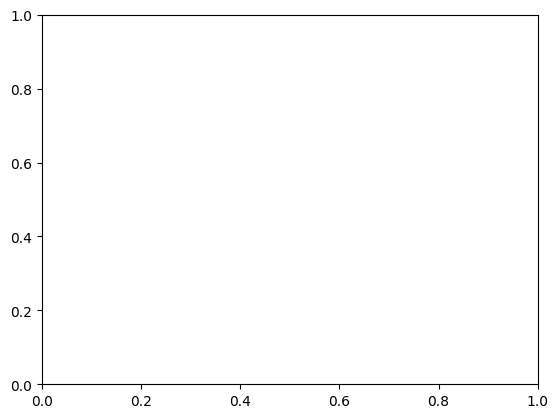

In [21]:
import matplotlib.pyplot as plt

df.boxplot(column="actual_price")
plt.show()


In [22]:
print(df["actual_price"].dtype)


str


In [23]:
df["actual_price"] = df["actual_price"].astype(str)

In [24]:
df["actual_price"] = df["actual_price"].str.replace("₹", "", regex=False)

In [25]:
df["actual_price"] = df["actual_price"].str.replace(",", "", regex=False)

In [26]:
df["actual_price"] = pd.to_numeric(df["actual_price"], errors="coerce")

In [27]:
df = df.dropna(subset=["actual_price"])


In [29]:
import matplotlib.pyplot as plt

df.bar(column="actual_price")
plt.show()


AttributeError: 'DataFrame' object has no attribute 'bar'

In [30]:
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv(r"C:\Users\pc\Desktop\dataAn\Excel\amazon.csv")


In [31]:
category_counts = df["category"].value_counts()


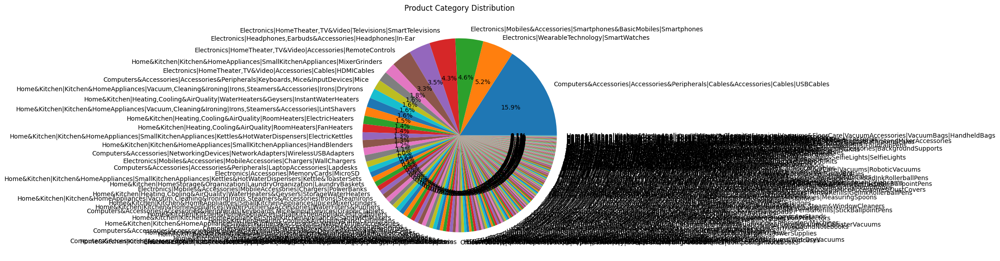

In [33]:
plt.figure(figsize=(7,8))

plt.pie(category_counts,
        labels=category_counts.index,
        autopct="%1.1f%%")

plt.title("Product Category Distribution")
plt.show()


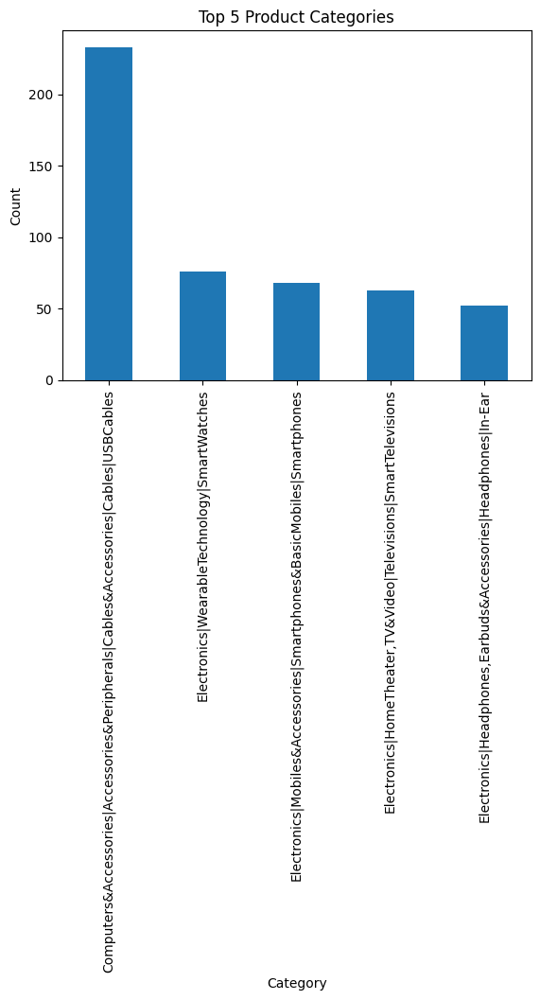

In [34]:
import pandas as pd
import matplotlib.pyplot as plt

# Data load
df = pd.read_csv(r"C:\Users\pc\Desktop\dataAn\Excel\amazon.csv")

# Top 5 category count
data = df["category"].value_counts().head(5)

# Bar graph
data.plot(kind="bar")

plt.title("Top 5 Product Categories")
plt.xlabel("Category")
plt.ylabel("Count")

plt.show()


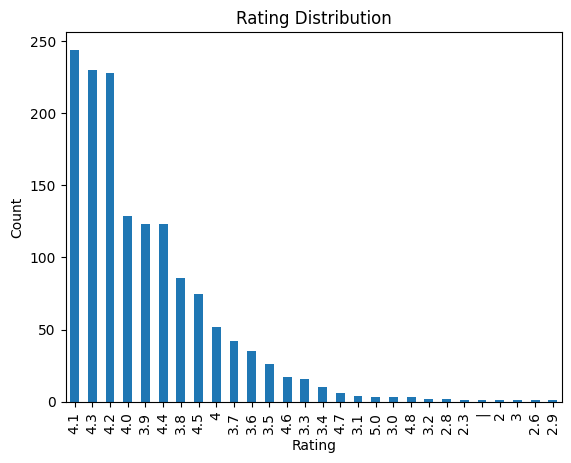

In [50]:
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv(r"C:\Users\pc\Desktop\dataAn\Excel\amazon.csv")

df["rating"].value_counts().plot(kind="bar")

plt.title("Rating Distribution")
plt.xlabel("Rating")
plt.ylabel("Count")

plt.show()


In [36]:
 print(df.shape)


(1465, 16)


In [37]:
df = df.sample(frac=0.5, random_state=1)


In [38]:
print(df.shape)


(732, 16)


In [39]:
df.to_csv("C:/Users/pc/Desktop/half_amazon.csv", index=False)


In [40]:
print(df)


      product_id                                       product_name  \
1005  B00LY17RHI      Camlin Elegante Fountain Pen - Black/Blue/Red   
653   B0B9LDCX89  STRIFF Mpad Mouse Mat 230X190X3mm Gaming Mouse...   
623   B096MSW6CT  Sounce Fast Phone Charging Cable & Data Sync U...   
919   B00LZPQVMK  Parker Vector Standard Chrome Trim Ball Pen (I...   
859   B09X76VL5L  boAt Airdopes 191G True Wireless Earbuds with ...   
...          ...                                                ...   
448   B097R25DP7  Noise ColorFit Pulse Smartwatch with 3.56 cm (...   
729   B0B217Z5VK  Noise Buds VS402 Truly Wireless in Ear Earbuds...   
567   B0B298D54H  Prolet Classic Bumper Case Cover for Samsung G...   
619   B0B3N7LR6K  Fire-Boltt Visionary 1.78" AMOLED Bluetooth Ca...   
1309  B0BPJBTB3F  Khaitan ORFin Fan heater for Home and kitchen-...   

                                               category discounted_price  \
1005  OfficeProducts|OfficePaperProducts|Paper|Stati...             ₹22

In [41]:
print(df.head())


      product_id                                       product_name  \
1005  B00LY17RHI      Camlin Elegante Fountain Pen - Black/Blue/Red   
653   B0B9LDCX89  STRIFF Mpad Mouse Mat 230X190X3mm Gaming Mouse...   
623   B096MSW6CT  Sounce Fast Phone Charging Cable & Data Sync U...   
919   B00LZPQVMK  Parker Vector Standard Chrome Trim Ball Pen (I...   
859   B09X76VL5L  boAt Airdopes 191G True Wireless Earbuds with ...   

                                               category discounted_price  \
1005  OfficeProducts|OfficePaperProducts|Paper|Stati...             ₹225   
653   Computers&Accessories|Accessories&Peripherals|...             ₹129   
623   Computers&Accessories|Accessories&Peripherals|...             ₹199   
919   OfficeProducts|OfficePaperProducts|Paper|Stati...             ₹272   
859   Electronics|Headphones,Earbuds&Accessories|Hea...           ₹1,599   

     actual_price discount_percentage rating rating_count  \
1005         ₹225                  0%    4.1        4,7

In [42]:
print(df.columns)


Index(['product_id', 'product_name', 'category', 'discounted_price',
       'actual_price', 'discount_percentage', 'rating', 'rating_count',
       'about_product', 'user_id', 'user_name', 'review_id', 'review_title',
       'review_content', 'img_link', 'product_link'],
      dtype='str')


In [43]:
print(df.to_string())


      product_id                                                                                                                                                                                                                                                product_name                                                                                                                 category discounted_price actual_price discount_percentage rating rating_count                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             

In [44]:
df = df.sort_values(by="actual_price", ascending=True)
print(df.head())


      product_id                                       product_name  \
5     B08Y1TFSP6  pTron Solero TB301 3A Type-C Data and Fast Cha...   
593   B0BDRVFDKP  SanDisk Ultra® microSDXC™ UHS-I Card, 64GB, 14...   
1048  B096YCN3SD  Lifelong LLEK15 Electric Kettle 1.5L with Stai...   
248   B09BW2GP18  Croma 3A Fast charge 1m Type-C to All Type-C P...   
403   B08Y1TFSP6  pTron Solero TB301 3A Type-C Data and Fast Cha...   

                                               category discounted_price  \
5     Computers&Accessories|Accessories&Peripherals|...             ₹149   
593         Electronics|Accessories|MemoryCards|MicroSD             ₹569   
1048  Home&Kitchen|Kitchen&HomeAppliances|SmallKitch...             ₹549   
248   Computers&Accessories|Accessories&Peripherals|...             ₹129   
403   Computers&Accessories|Accessories&Peripherals|...             ₹149   

     actual_price discount_percentage rating rating_count  \
5          ₹1,000                 85%    3.9       24,8

In [45]:
df = df.sort_values(by="rating", ascending=True)
print(df.head())


      product_id                                       product_name  \
1309  B0BPJBTB3F  Khaitan ORFin Fan heater for Home and kitchen-...   
1243  B0BFBNXS94  Personal Size Blender, Portable Blender, Batte...   
1286  B0BNDGL26T  MR. BRAND Portable USB Juicer Electric USB Jui...   
1449  B0BBLHTRM9  IONIX Tap filter Multilayer | Activated Carbon...   
550   B0B82YGCF6  Tokdis MX-1 Pro Bluetooth Calling Smartwatch -...   

                                               category discounted_price  \
1309  Home&Kitchen|Heating,Cooling&AirQuality|RoomHe...           ₹1,299   
1243  Home&Kitchen|Kitchen&HomeAppliances|SmallKitch...             ₹669   
1286  Home&Kitchen|Kitchen&HomeAppliances|SmallKitch...             ₹499   
1449  Home&Kitchen|Kitchen&HomeAppliances|WaterPurif...             ₹199   
550         Electronics|WearableTechnology|SmartWatches             ₹899   

     actual_price discount_percentage rating rating_count  \
1309       ₹2,495                 48%      2           

In [46]:
df = df.sort_values(by="actual_price", ascending=False)


In [47]:
df = df.sort_values(by=["rating", "actual_price"], ascending=True)


In [48]:
df = df.sort_values(by="actual_price", ascending=False)
print(df.head(10))


     product_id                                       product_name  \
653  B0B9LDCX89  STRIFF Mpad Mouse Mat 230X190X3mm Gaming Mouse...   
841  B084BR3QX8  LAPSTER Accessories Power Cable Cord 2 Pin Lap...   
241  B081FJWN52  Wayona Usb Type C To Usb Nylon Braided Quick C...   
528  B09GP6FBZT  OpenTech® Military-Grade Tempered Glass Screen...   
48   B09L8DSSFH  7SEVEN® Compatible for Samsung Smart 4K Ultra ...   
257  B08CT62BM1  Wayona USB Type C Fast Charging Cable Charger ...   
111  B0974G5Q2Y  boAt Laptop, Smartphone Type-c A400 Male Data ...   
131  B09QGZM8QB  Wayona Usb Type C 65W 6Ft/2M Long Fast Chargin...   
424  B09XBJ1CTN  MI Xiaomi 22.5W Fast USB Type C Charger Combo ...   
503  B077Z65HSD  boAt A400 USB Type-C to USB-A 2.0 Male Data Ca...   

                                              category discounted_price  \
653  Computers&Accessories|Accessories&Peripherals|...             ₹129   
841  Computers&Accessories|Accessories&Peripherals|...             ₹149   
241 

In [49]:
df.sort_values(by="actual_price", ascending=True)


,product_id,product_name,category,discounted_price,actual_price,discount_percentage,rating,rating_count,about_product,user_id,user_name,review_id,review_title,review_content,img_link,product_link
403,B08Y1TFSP6,pTron Solero TB301 3A Type-C Data and Fast Cha...,Computers&Accessories|Accessories&Peripherals|...,₹149,"₹1,000",85%,3.9,"24,870",Fast Charging & Data Sync: Solero TB301 Type-C...,"AEQ2YMXSZWEOHK2EHTNLOS56YTZQ,AGRVINWECNY7323CW...","Jayesh,Rajesh k.,Soopy,amazon customer,Aman,Sh...","R7S8ANNSDPR40,R3CLZFLHVJU26P,RFF7U7MPQFUGR,R1M...","It's pretty good,Average quality,very good and...","It's a good product.,Like,Very good item stron...",https://m.media-amazon.com/images/I/31wOPjcSxl...,https://www.amazon.in/Solero-TB301-Charging-48...
593,B0BDRVFDKP,"SanDisk Ultra® microSDXC™ UHS-I Card, 64GB, 14...",Electronics|Accessories|MemoryCards|MicroSD,₹569,"₹1,000",43%,4.4,"67,262",Ideal storage for Android smartphones and tabl...,"AG44HJB2AMIVHAGQZ2WGWONERKCA,AHL2FABQV6XAHZN54...","Prashant,Sumesh Sundararajan,Vijay Baitha,S.k ...","R2A7MIUNOW8DOE,R2FXP703540FR1,R37E7QJET0BYE8,R...","Fake Product,Costly but excellent quality,Stor...",128GB SD Card is showing 134GBDon't buy this p...,https://m.media-amazon.com/images/I/41ML8ZbPii...,https://www.amazon.in/SanDisk-Ultra%C2%AE-micr...
5,B08Y1TFSP6,pTron Solero TB301 3A Type-C Data and Fast Cha...,Computers&Accessories|Accessories&Peripherals|...,₹149,"₹1,000",85%,3.9,"24,871",Fast Charging & Data Sync: Solero TB301 Type-C...,"AEQ2YMXSZWEOHK2EHTNLOS56YTZQ,AGRVINWECNY7323CW...","Jayesh,Rajesh k.,Soopy,amazon customer,Aman,Sh...","R7S8ANNSDPR40,R3CLZFLHVJU26P,RFF7U7MPQFUGR,R1M...","It's pretty good,Average quality,very good and...","It's a good product.,Like,Very good item stron...",https://m.media-amazon.com/images/I/31wOPjcSxl...,https://www.amazon.in/Solero-TB301-Charging-48...
1048,B096YCN3SD,Lifelong LLEK15 Electric Kettle 1.5L with Stai...,Home&Kitchen|Kitchen&HomeAppliances|SmallKitch...,₹549,"₹1,000",45%,3.6,"1,074","Stainless steel body, concealed element and si...","AHM4ZOXDCO5UNP4WQUXKP4NWX64A,AGHJ3BRARYIXJRGPK...","Kiran jot,Salman Ahmad,Neelam Rawat,Nawaz Akht...","R2QR5PM0ELMWD3,RZFX345XRS4V2,R352PKGSDAV1AW,R1...","Well over all iits nice, make sure the lid of ...","Well over all iits nice, make sure the lid of ...",https://m.media-amazon.com/images/W/WEBP_40237...,https://www.amazon.in/Lifelong-LLEK15-Electric...
248,B09BW2GP18,Croma 3A Fast charge 1m Type-C to All Type-C P...,Computers&Accessories|Accessories&Peripherals|...,₹129,"₹1,000",87%,3.9,295,Type-C to Type-C sync and charge cable support...,"AG3TIHPAHFYCX3XQ3TQ2OB5IAJXQ,AEEMOUFPIMWI2J6CN...","Aneesh See Yay,Narendra Choudhari,Amazon Custo...","R1TBHUMR0RV7AZ,R2BN9ZX0H3ZQV2,R2PMUD745GQT3E,R...","Great value for money,Iys good,Poor quality,Go...","Excellent product,It's just a day old now. Loo...",https://m.media-amazon.com/images/I/31qs7auuBK...,https://www.amazon.in/Croma-transfer-Durabilit...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62,B0994GFWBH,Lapster 1.5 mtr USB 2.0 Type A Male to USB A M...,Computers&Accessories|Accessories&Peripherals|...,₹139,₹999,86%,4.0,"1,313",Plug & Play|Stable & Reliable Connectivity.|Sp...,"AF42EMTPEJAL4LNEPPX77TN77UHA,AHBMZRY43T2GTYDVN...","pruthvi natraj,Phani,Amazon Customer,TechDevot...","RZJR37WFGXR9B,R39X6O18GM16TM,R18ZQ09EKVWZ9R,R3...","A well-priced product.,Lenthy cord.,Product is...","i am writing this review after 2 months, the f...",https://m.media-amazon.com/images/I/310WOJIrwj...,https://www.amazon.in/Lapster-Type-Cable-compu...
1459,B0B3JSWG81,NGI Store 2 Pieces Pet Hair Removers for Your ...,"Home&Kitchen|Kitchen&HomeAppliances|Vacuum,Cle...",₹199,₹999,80%,3.1,2,"Versatile, Protects Your Clothes: MoveCatcher ...",AFPKVN5KLHB4MHSYDS25Q5MIWWKQ,Kunal Sen,R18OKMWGX8SA0L,Useless,Does not work as advertised at all. The pieces...,https://m.media-amazon.com/images/W/WEBP_40237...,https://www.amazon.in/Hair-Removers-Laundry-Re...
37,B09RZS1NQT,"